# YOLO26 Logo Detection Training

**Dataset:** LOGOS.yolov11 — 1466 ảnh, 15 classes  
**Classes:** Cladding_king, Sports Events Services, acs_group, aon_white_logo, atm_hospitality, bartercard, castore, floor_tonic, kinetic, klg, mcp_home, mna_cladding, mna_support, romantica_white_logo, summit

## Hướng dẫn chuẩn bị dữ liệu

1. Zip toàn bộ thư mục `LOGOS.yolov11` thành `LOGOS.yolov11.zip`
2. Upload file zip lên Google Drive (ví dụ: `My Drive/datasets/LOGOS.yolov11.zip`)
3. Chạy các cell theo thứ tự từ trên xuống

## 1. Kiểm tra GPU

In [ ]:
import subprocess
result = subprocess.run(['nvidia-smi'], capture_output=True, text=True)
print(result.stdout if result.returncode == 0 else 'Không tìm thấy GPU — hãy vào Runtime > Change runtime type > GPU')

Sun May 31 05:19:08 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   44C    P8             12W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## 2. Cài đặt thư viện

In [ ]:
!pip install ultralytics --upgrade --quiet
import ultralytics
ultralytics.checks()

Ultralytics 8.4.57 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 47.1/112.6 GB disk)


## 3. Mount Google Drive và giải nén dữ liệu

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

# ============================================================
# Đường dẫn tới file zip trên Google Drive — CHỈNH SỬA NẾU CẦN
ZIP_PATH = '/content/drive/MyDrive/datasets/LOGOS.yolov11.zip'
EXTRACT_DIR = '/content/LOGOS.yolov11'
# ============================================================

if not os.path.exists(ZIP_PATH):
    raise FileNotFoundError(f'Không tìm thấy file zip tại: {ZIP_PATH}\nHãy chỉnh lại biến ZIP_PATH cho đúng đường dẫn.')

print(f'Giải nén {ZIP_PATH} ...')
!unzip -q "{ZIP_PATH}" -d "{EXTRACT_DIR}"
print('Xong!')

# Kiểm tra cấu trúc
for root, dirs, files in os.walk(EXTRACT_DIR):
    depth = root.replace(EXTRACT_DIR, '').count(os.sep)
    if depth > 2:
        continue
    indent = '  ' * depth
    print(f'{indent}{os.path.basename(root)}/')
    if depth == 2:
        print(f'{indent}  ... ({len(files)} files)')

Giải nén /content/drive/MyDrive/datasets/LOGOS.yolov11.zip ...
Xong!
LOGOS.yolov11/
  train/
    images/
      ... (1466 files)
    labels/
      ... (1466 files)


## 4. Chia dữ liệu train / val / test (80 / 10 / 10)

In [ ]:
import shutil
import random
from pathlib import Path

random.seed(42)

SRC_IMAGES = Path(EXTRACT_DIR) / 'train' / 'images'
SRC_LABELS = Path(EXTRACT_DIR) / 'train' / 'labels'

# Lấy danh sách ảnh có label tương ứng
image_files = sorted(SRC_IMAGES.glob('*.jpg')) + sorted(SRC_IMAGES.glob('*.png'))
paired = [f for f in image_files if (SRC_LABELS / f.with_suffix('.txt').name).exists()]
random.shuffle(paired)

n = len(paired)
n_val = int(n * 0.1)
n_test = int(n * 0.1)
n_train = n - n_val - n_test

splits = {
    'train': paired[:n_train],
    'val':   paired[n_train:n_train + n_val],
    'test':  paired[n_train + n_val:],
}

DATASET_DIR = Path('/content/dataset')

for split, files in splits.items():
    img_dir = DATASET_DIR / split / 'images'
    lbl_dir = DATASET_DIR / split / 'labels'
    img_dir.mkdir(parents=True, exist_ok=True)
    lbl_dir.mkdir(parents=True, exist_ok=True)
    for img_path in files:
        shutil.copy(img_path, img_dir / img_path.name)
        lbl_path = SRC_LABELS / img_path.with_suffix('.txt').name
        shutil.copy(lbl_path, lbl_dir / lbl_path.name)
    print(f'{split:5s}: {len(files):4d} ảnh')

print(f'\nTổng: {n} ảnh')

train: 1174 ảnh
val  :  146 ảnh
test :  146 ảnh

Tổng: 1466 ảnh


## 5. Tạo file data.yaml

In [ ]:
import yaml

data_yaml = {
    'path': str(DATASET_DIR),
    'train': 'train/images',
    'val':   'val/images',
    'test':  'test/images',
    'nc': 15,
    'names': [
        'Cladding_king',
        'Sports Events Services',
        'acs_group',
        'aon_white_logo',
        'atm_hospitality',
        'bartercard',
        'castore',
        'floor_tonic',
        'kinetic',
        'klg',
        'mcp_home',
        'mna_cladding',
        'mna_support',
        'romantica_white_logo',
        'summit',
    ]
}

yaml_path = DATASET_DIR / 'data.yaml'
with open(yaml_path, 'w') as f:
    yaml.dump(data_yaml, f, allow_unicode=True, sort_keys=False)

print(open(yaml_path).read())

path: /content/dataset
train: train/images
val: val/images
test: test/images
nc: 15
names:
- Cladding_king
- Sports Events Services
- acs_group
- aon_white_logo
- atm_hospitality
- bartercard
- castore
- floor_tonic
- kinetic
- klg
- mcp_home
- mna_cladding
- mna_support
- romantica_white_logo
- summit



## 6. Training YOLO26

| Model | Tốc độ | Độ chính xác |
|-------|--------|---------------|
| yolo26n | Nhanh nhất | Thấp nhất |
| yolo26s | Nhanh | Trung bình |
| yolo26m | Trung bình | Tốt |
| yolo26l | Chậm | Cao |
| yolo26x | Chậm nhất | Cao nhất |

Khuyến nghị: **yolo26s** cho Colab T4 với 1466 ảnh.

In [ ]:
from ultralytics import YOLO
from pathlib import Path

# ============================================================
# Cấu hình training — CHỈNH SỬA NẾU CẦN
MODEL     = 'yolo26s.pt'   # yolo26n / yolo26s / yolo26m / yolo26l / yolo26x
EPOCHS    = 100
IMG_SIZE  = 640
BATCH     = 16             # Giảm xuống 8 nếu bị OOM
PROJECT   = 'runs/detect'
RUN_NAME  = 'logos_yolo26s'
# ============================================================

model = YOLO(MODEL)

results = model.train(
    data=str(yaml_path),
    epochs=EPOCHS,
    imgsz=IMG_SIZE,
    batch=BATCH,
    project=PROJECT,
    name=RUN_NAME,
    patience=20,
    save=True,
    device=0,
    workers=4,
    exist_ok=True,
    plots=True,
)

# Lấy đường dẫn thực từ kết quả training
run_dir         = str(results.save_dir)
best_model_path = str(Path(run_dir) / 'weights' / 'best.pt')
last_model_path = str(Path(run_dir) / 'weights' / 'last.pt')
print(f'\nRun saved at : {run_dir}')
print(f'Best weights : {best_model_path}')

Ultralytics 8.4.57 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=logos_yolo26s, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=20

In [ ]:
# ── Helper: tìm run_dir thực, dùng chung cho mọi cell bên dưới ─────────────
import os
from pathlib import Path

def _resolve_run():
    """Trả về (run_dir, best_model_path, last_model_path)."""
    # Ưu tiên run_dir đã được set bởi cell Training
    rd = globals().get('run_dir', '')
    if not rd or not os.path.isdir(rd):
        candidates = sorted(
            Path(PROJECT).glob(f'{RUN_NAME}*'),
            key=lambda p: p.stat().st_mtime,
        )
        if not candidates:
            raise FileNotFoundError(
                f'Không tìm thấy thư mục run trong {PROJECT}/\n'
                'Hãy chạy Cell 6 (Training) đến khi hoàn tất.'
            )
        rd = str(candidates[-1])
        print(f'Auto-detected run_dir: {rd}')

    bp = str(Path(rd) / 'weights' / 'best.pt')
    lp = str(Path(rd) / 'weights' / 'last.pt')
    if not os.path.exists(bp):
        if os.path.exists(lp):
            print('best.pt chưa có → dùng last.pt')
            bp = lp
        else:
            raise FileNotFoundError(f'Không tìm thấy weights trong: {rd}/weights/')
    return rd, bp, lp

print('Helper _resolve_run() đã sẵn sàng.')


Helper _resolve_run() đã sẵn sàng.


## 7. Đánh giá trên tập test

In [ ]:
run_dir, best_model_path, last_model_path = _resolve_run()

model_best = YOLO(best_model_path)
metrics = model_best.val(
    data=str(yaml_path),
    split='test',
    imgsz=IMG_SIZE,
    plots=True,
)

print(f'\nmAP50    : {metrics.box.map50:.4f}')
print(f'mAP50-95 : {metrics.box.map:.4f}')
print(f'Precision: {metrics.box.mp:.4f}')
print(f'Recall   : {metrics.box.mr:.4f}')


Ultralytics 8.4.57 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26s summary (fused): 122 layers, 9,470,985 parameters, 0 gradients, 20.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1386.7±296.7 MB/s, size: 62.2 KB)
val: Scanning /content/dataset/test/labels... 146 images, 8 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 146/146 1.9Kit/s 0.1s
val: New cache created: /content/dataset/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 2.8it/s 3.6s
                   all        146        641      0.811      0.842      0.879       0.66
         Cladding_king         16         24      0.865        0.8      0.925      0.639
Sports Events Services         39         55      0.844      0.909      0.921      0.709
             acs_group         42         57      0.857      0.737      0.897      0.657
        aon_white_logo         26         34      0.709      0.853      0.851      

## 8. Xem kết quả training (biểu đồ)

--- results.png ---


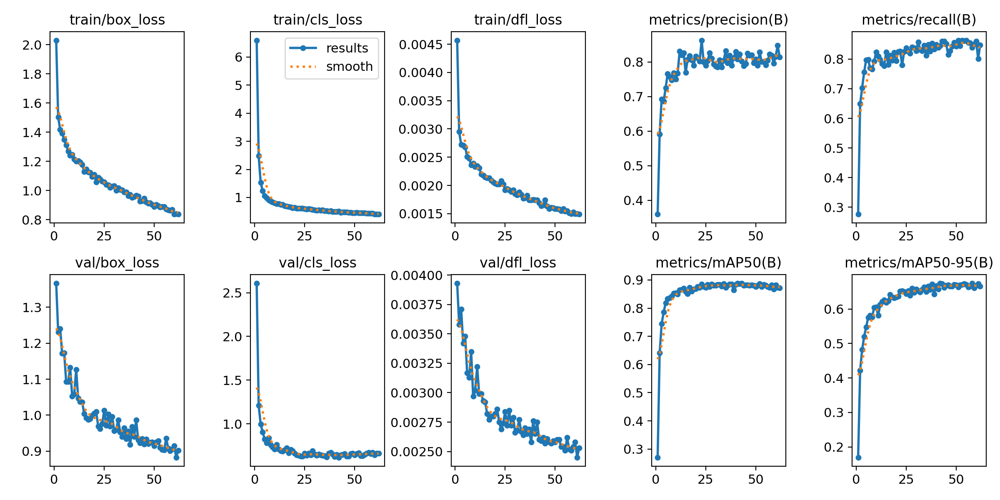

--- confusion_matrix.png ---


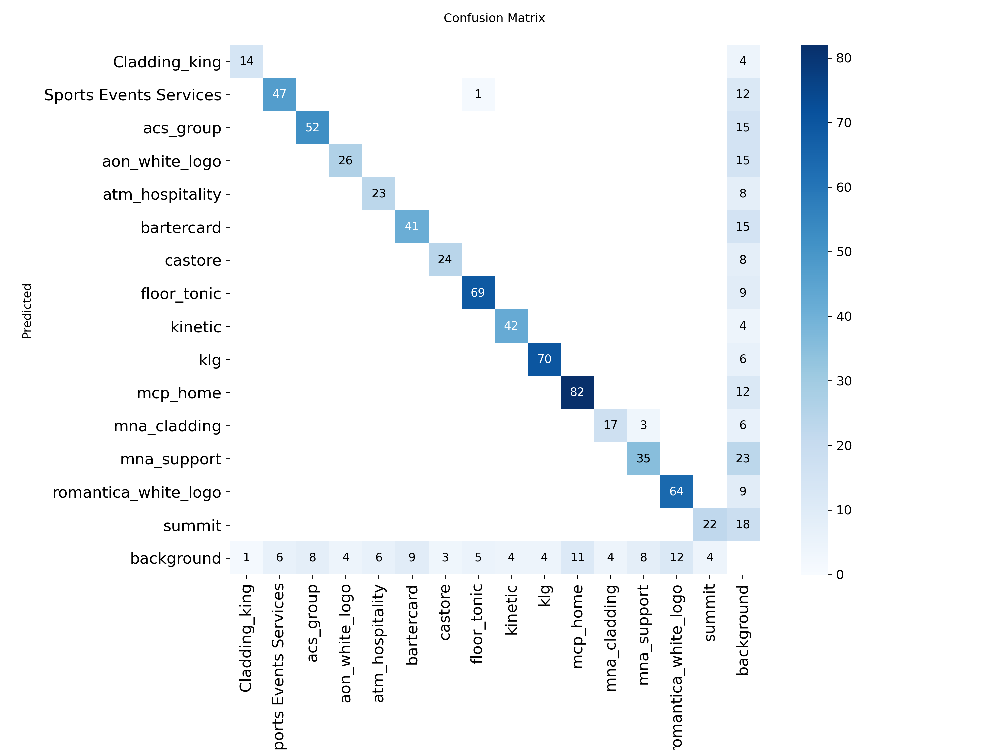

In [ ]:
from IPython.display import Image, display
import os

run_dir, _, _ = _resolve_run()

for img_name in ['results.png', 'confusion_matrix.png', 'PR_curve.png', 'F1_curve.png']:
    img_path = os.path.join(run_dir, img_name)
    if os.path.exists(img_path):
        print(f'--- {img_name} ---')
        display(Image(img_path, width=900))


## 9. Inference thử trên ảnh mẫu


0: 384x640 4 Sports Events Servicess, 3 kinetics, 1 mna_support, 17.3ms
1: 384x640 4 Cladding_kings, 1 kinetic, 17.3ms
2: 384x640 1 Sports Events Services, 1 castore, 1 summit, 17.3ms
3: 384x640 1 Sports Events Services, 1 castore, 1 summit, 17.3ms
Speed: 1.4ms preprocess, 17.3ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/runs/detect/predict
Kết quả lưu tại: /content/runs/detect/predict


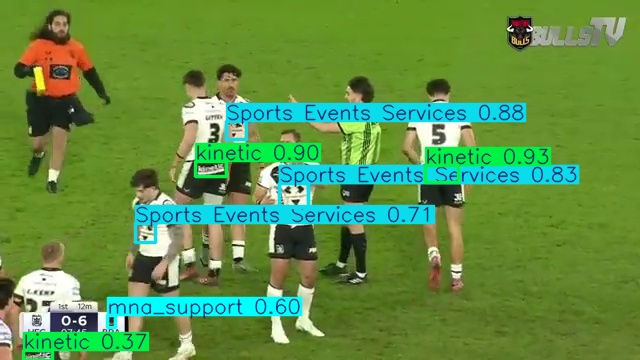

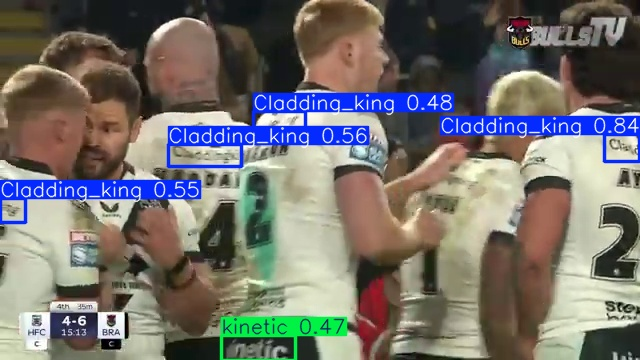

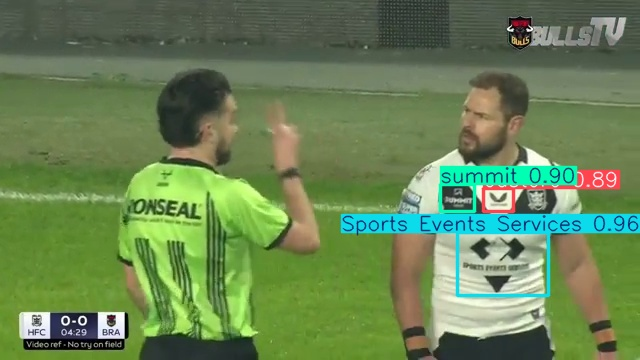

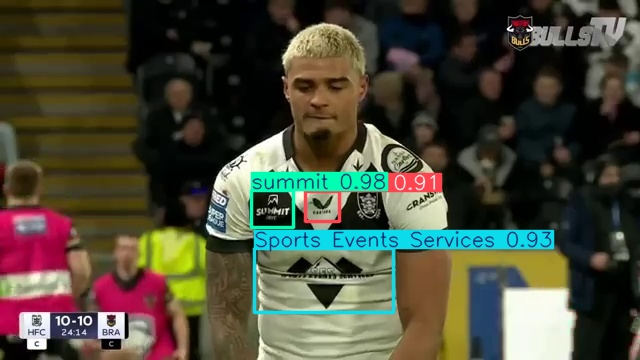

In [ ]:
from IPython.display import Image as IPImage, display
from pathlib import Path

run_dir, best_model_path, _ = _resolve_run()
if 'model_best' not in dir():
    model_best = YOLO(best_model_path)

test_img_dir = Path('/content/dataset/test/images')
test_images  = list(test_img_dir.glob('*.jpg'))[:4]

if not test_images:
    print('Không có ảnh test. Hãy chạy Cell 4 (chia dữ liệu) trước.')
else:
    results_sample = model_best.predict(
        source=test_images,
        save=True,
        conf=0.25,
        imgsz=IMG_SIZE,
    )
    pred_save_dir = Path(results_sample[0].save_dir)
    print(f'Kết quả lưu tại: {pred_save_dir}')
    for img_file in sorted(pred_save_dir.glob('*.jpg'))[:4]:
        display(IPImage(str(img_file), width=700))


## 10. Export model và lưu về Google Drive

In [ ]:
run_dir, best_model_path, _ = _resolve_run()
if 'model_best' not in dir():
    model_best = YOLO(best_model_path)

model_best.export(format='onnx', imgsz=IMG_SIZE, simplify=True)
print('Đã export ONNX.')


Ultralytics 8.4.57 🚀 Python-3.12.13 torch-2.11.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/

PyTorch: starting from '/content/runs/detect/runs/detect/logos_yolo26s/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 300, 6) (19.4 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0,<2.0.0', 'onnxslim>=0.1.82', 'onnxruntime'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 12 packages in 247ms
Prepared 4 packages in 1.50s
Installed 4 packages in 243ms
 + colorama==0.4.6
 + onnx==1.21.0
 + onnxruntime==1.26.0
 + onnxslim==0.1.94

requirements: AutoUpdate success ✅ 2.6s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.21.0 opset 20...


/usr/local/lib/python3.12/dist-packages/torch/onnx/_internal/torchscript_exporter/symbolic_opset11.py:954: UserWarning: Exporting aten::index operator of advanced indexing in opset 20 is achieved by combination of multiple ONNX operators, including Reshape, Transpose, Concat, and Gather. If indices include negative values, the exported graph will produce incorrect results.
  return opset9.index(g, self, index)


ONNX: slimming with onnxslim 0.1.94...
ONNX: export success ✅ 5.5s, saved as '/content/runs/detect/runs/detect/logos_yolo26s/weights/best.onnx' (36.4 MB)

Export complete (6.3s)
Results saved to /content/runs/detect/runs/detect/logos_yolo26s/weights/best.onnx
Predict:         yolo predict task=detect model=/content/runs/detect/runs/detect/logos_yolo26s/weights/best.onnx imgsz=640 
Validate:        yolo val task=detect model=/content/runs/detect/runs/detect/logos_yolo26s/weights/best.onnx imgsz=640 data=/content/dataset/data.yaml  
Visualize:       https://netron.app
Đã export ONNX.


In [ ]:
import shutil, os
from pathlib import Path

# ============================================================
# Thư mục lưu trên Google Drive — CHỈNH SỬA NẾU CẦN
SAVE_DIR = '/content/drive/MyDrive/models/logos_yolo26'
# ============================================================

run_dir, _, _ = _resolve_run()
os.makedirs(SAVE_DIR, exist_ok=True)

for fname in ['best.pt', 'last.pt']:
    src = os.path.join(run_dir, 'weights', fname)
    if os.path.exists(src):
        shutil.copy(src, SAVE_DIR)
        print(f'Đã lưu {fname}')

onnx_src = os.path.join(run_dir, 'weights', 'best.onnx')
if os.path.exists(onnx_src):
    shutil.copy(onnx_src, SAVE_DIR)
    print('Đã lưu best.onnx')

dest_run = os.path.join(SAVE_DIR, Path(run_dir).name)
shutil.copytree(run_dir, dest_run, dirs_exist_ok=True)
print(f'\nTất cả đã lưu tại: {dest_run}')


Đã lưu best.pt
Đã lưu last.pt
Đã lưu best.onnx

Tất cả đã lưu tại: /content/drive/MyDrive/models/logos_yolo26/logos_yolo26s


## 11. Test với ảnh mới từ máy tính

Nhấn "Choose Files" để chọn ảnh (jpg / png):


Saving frame_03150_time_1575-00s_jpg.rf.6SIW1qmTg7Jc8w57UxTp.jpg to frame_03150_time_1575-00s_jpg.rf.6SIW1qmTg7Jc8w57UxTp (1).jpg
Đã nhận 1 ảnh — đang chạy inference...

image 1/1 /content/uploaded_images/frame_03150_time_1575-00s_jpg.rf.6SIW1qmTg7Jc8w57UxTp (1).jpg: 384x640 1 Sports Events Services, 3 acs_groups, 1 aon_white_logo, 1 kinetic, 2 klgs, 1 mcp_home, 13.7ms
Speed: 2.1ms preprocess, 13.7ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/runs/detect/predict
Kết quả lưu tại: /content/runs/detect/predict
6 ảnh kết quả:


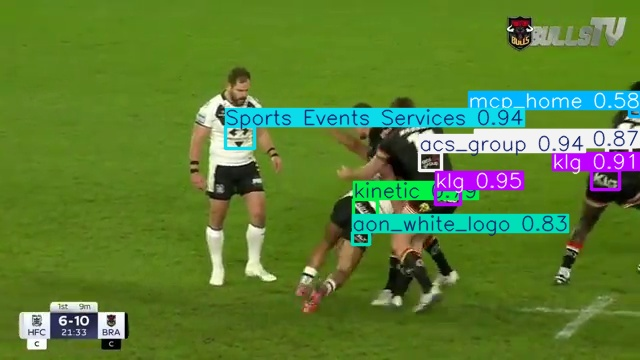

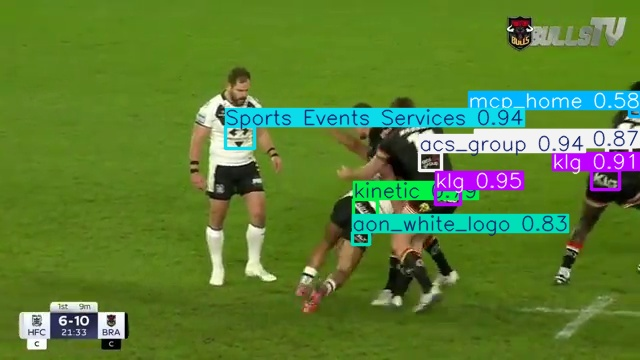

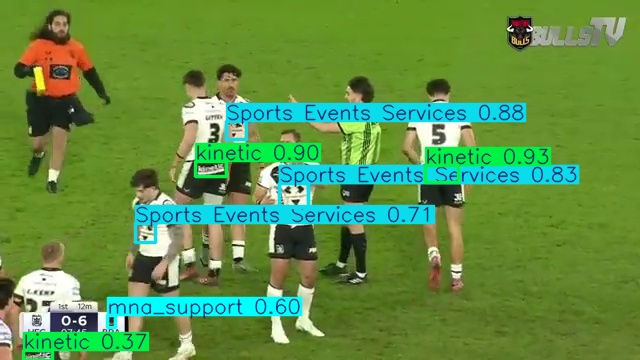

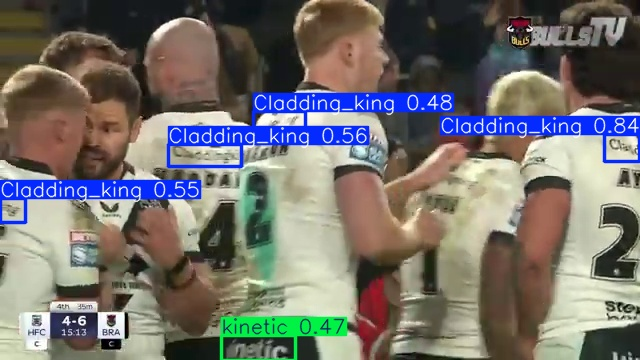

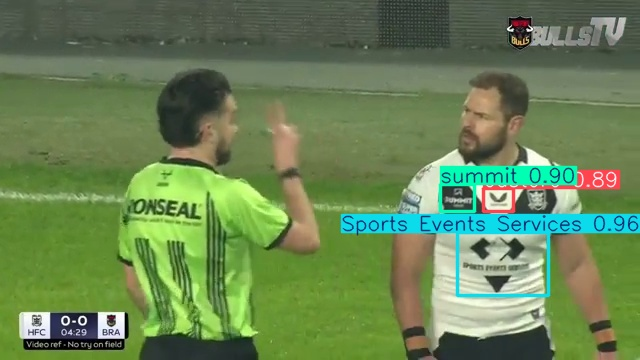

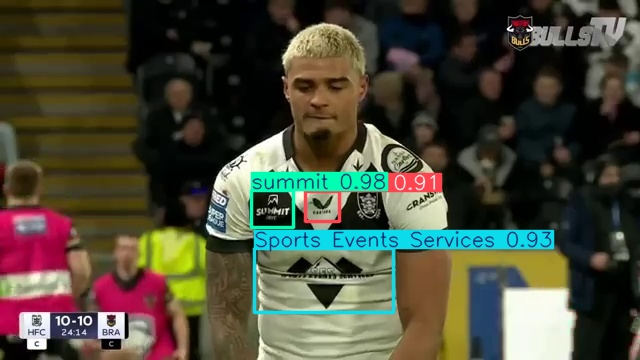

In [ ]:
from google.colab import files
from IPython.display import Image as IPImage, display
from pathlib import Path
import shutil

run_dir, best_model_path, _ = _resolve_run()
if 'model_best' not in dir():
    model_best = YOLO(best_model_path)

# Xoá ảnh upload cũ để tránh lẫn kết quả
upload_dir = Path('/content/uploaded_images')
if upload_dir.exists():
    shutil.rmtree(upload_dir)
upload_dir.mkdir()

print('Nhấn "Choose Files" để chọn ảnh (jpg / png):')
uploaded = files.upload()   # <-- nút upload hiện ra ở đây

if not uploaded:
    print('Không có ảnh nào được chọn.')
else:
    for fname, data in uploaded.items():
        (upload_dir / fname).write_bytes(data)
    print(f'Đã nhận {len(uploaded)} ảnh — đang chạy inference...')

    results_img = model_best.predict(
        source=str(upload_dir),
        save=True,
        conf=0.25,
        imgsz=IMG_SIZE,
        line_width=2,
    )
    pred_save_dir = Path(results_img[0].save_dir)
    print(f'Kết quả lưu tại: {pred_save_dir}')

    result_imgs = sorted(pred_save_dir.glob('*.jpg')) + sorted(pred_save_dir.glob('*.png'))
    print(f'{len(result_imgs)} ảnh kết quả:')
    for img_file in result_imgs:
        display(IPImage(str(img_file), width=800))


## 12. Test với video mới từ máy tính

In [ ]:
from google.colab import files
from IPython.display import Video, display
from pathlib import Path
import os

run_dir, best_model_path, _ = _resolve_run()
if 'model_best' not in dir():
    model_best = YOLO(best_model_path)

print('Nhấn "Choose Files" để chọn video (mp4 / avi / mov):')
uploaded_video = files.upload()   # <-- nút upload hiện ra ở đây

if not uploaded_video:
    print('Không có video nào được chọn.')
else:
    fname      = list(uploaded_video.keys())[0]
    video_path = f'/content/{fname}'
    with open(video_path, 'wb') as vf:
        vf.write(uploaded_video[fname])
    print(f'Đã nhận: {fname}')
    print('Đang chạy inference (có thể mất vài phút)...')

    gen   = model_best.predict(
        source=video_path,
        save=True,
        conf=0.25,
        imgsz=IMG_SIZE,
        line_width=2,
        stream=True,
    )
    first        = next(gen)
    pred_save_dir = Path(first.save_dir)
    for _ in gen:
        pass   # xử lý hết các frame còn lại

    print(f'Kết quả lưu tại: {pred_save_dir}')

    video_out = next(
        (p for ext in ('*.mp4', '*.avi') for p in pred_save_dir.glob(ext)),
        None,
    )
    if video_out is None:
        print(f'Không tìm thấy video output trong: {pred_save_dir}')
    else:
        mp4_out = '/content/result_video.mp4'
        ret = os.system(
            f'ffmpeg -y -i "{video_out}" -vcodec libx264 -preset fast "{mp4_out}" -loglevel quiet'
        )
        if ret == 0 and os.path.exists(mp4_out):
            display(Video(mp4_out, embed=True, width=800))
            print('\nTải video kết quả về máy:')
            files.download(mp4_out)
        else:
            print(f'ffmpeg lỗi. File gốc: {video_out}')


Nhấn "Choose Files" để chọn video (mp4 / avi / mov):


Saving clip_004_01-59.mp4 to clip_004_01-59.mp4
Đã nhận: clip_004_01-59.mp4
Đang chạy inference (có thể mất vài phút)...

video 1/1 (frame 1/446) /content/clip_004_01-59.mp4: 384x640 3 acs_groups, 1 aon_white_logo, 4 klgs, 2 mcp_homes, 12.1ms
video 1/1 (frame 2/446) /content/clip_004_01-59.mp4: 384x640 3 acs_groups, 2 aon_white_logos, 4 klgs, 2 mcp_homes, 11.9ms
video 1/1 (frame 3/446) /content/clip_004_01-59.mp4: 384x640 2 acs_groups, 1 aon_white_logo, 4 klgs, 2 mcp_homes, 12.5ms
video 1/1 (frame 4/446) /content/clip_004_01-59.mp4: 384x640 3 acs_groups, 2 aon_white_logos, 4 klgs, 1 mcp_home, 12.1ms
video 1/1 (frame 5/446) /content/clip_004_01-59.mp4: 384x640 2 acs_groups, 3 aon_white_logos, 4 klgs, 2 mcp_homes, 12.5ms
video 1/1 (frame 6/446) /content/clip_004_01-59.mp4: 384x640 3 acs_groups, 2 aon_white_logos, 4 klgs, 3 mcp_homes, 12.9ms
video 1/1 (frame 7/446) /content/clip_004_01-59.mp4: 384x640 3 acs_groups, 2 aon_white_logos, 4 klgs, 3 mcp_homes, 11.9ms
video 1/1 (frame 8/446) /co


Tải video kết quả về máy:


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 13. Download model về máy

Chạy từng cell bên dưới theo nhu cầu:
- **Cell A**: Download `best.pt` (PyTorch weights) về máy tính
- **Cell B**: Download `best.onnx` về máy tính
- **Cell C**: Lưu toàn bộ thư mục run lên Google Drive (nếu chưa chạy Cell 10)


In [ ]:
# Cell A — Download best.pt về máy tính
from google.colab import files

run_dir, best_model_path, _ = _resolve_run()
print(f'Đang tải xuống: {best_model_path}')
files.download(best_model_path)


In [ ]:
# Cell B — Download best.onnx về máy tính
from google.colab import files
import os
from pathlib import Path

run_dir, best_model_path, _ = _resolve_run()
if 'model_best' not in dir():
    model_best = YOLO(best_model_path)

onnx_path = str(Path(run_dir) / 'weights' / 'best.onnx')
if not os.path.exists(onnx_path):
    print('Chưa có ONNX, đang export...')
    model_best.export(format='onnx', imgsz=IMG_SIZE, simplify=True)

print(f'Đang tải xuống: {onnx_path}')
files.download(onnx_path)


In [ ]:
# Cell C — Lưu toàn bộ thư mục run lên Google Drive
import shutil, os
from pathlib import Path

SAVE_DIR = '/content/drive/MyDrive/models/logos_yolo26'
run_dir, _, _ = _resolve_run()
os.makedirs(SAVE_DIR, exist_ok=True)

for fname in ['best.pt', 'last.pt']:
    src = os.path.join(run_dir, 'weights', fname)
    if os.path.exists(src):
        shutil.copy(src, SAVE_DIR)
        print(f'Đã lưu {fname} → {SAVE_DIR}')

onnx_src = os.path.join(run_dir, 'weights', 'best.onnx')
if os.path.exists(onnx_src):
    shutil.copy(onnx_src, SAVE_DIR)
    print(f'Đã lưu best.onnx → {SAVE_DIR}')

dest_run = os.path.join(SAVE_DIR, Path(run_dir).name)
shutil.copytree(run_dir, dest_run, dirs_exist_ok=True)
print(f'\nToàn bộ run đã lưu tại: {dest_run}')


Đã lưu best.pt → /content/drive/MyDrive/models/logos_yolo26
Đã lưu last.pt → /content/drive/MyDrive/models/logos_yolo26
Đã lưu best.onnx → /content/drive/MyDrive/models/logos_yolo26

Toàn bộ run đã lưu tại: /content/drive/MyDrive/models/logos_yolo26/logos_yolo26s
